In [1]:
import geopandas as gpd
import contextily as ctx
import plotly.express as px
import matplotlib.pyplot as plt

import matplotlib as mpl

mpl.rc('font',family='MS Gothic')

In [2]:
gdf = gpd.read_file('B002005212020DDSWC12208.zip')

In [3]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2814 entries, 0 to 2813
Data columns (total 38 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   KEY_CODE   2814 non-null   object  
 1   PREF       2814 non-null   object  
 2   CITY       2814 non-null   object  
 3   K_AREA     2814 non-null   object  
 4   S_AREA     2814 non-null   object  
 5   PREF_NAME  2814 non-null   object  
 6   CITY_NAME  2814 non-null   object  
 7   S_NAME     2814 non-null   object  
 8   KIGO_E     0 non-null      float64 
 9   HCODE      2814 non-null   int64   
 10  AREA       2814 non-null   float64 
 11  PERIMETER  2814 non-null   float64 
 12  KIHON1     2814 non-null   object  
 13  DUMMY1     2814 non-null   object  
 14  KIHON2     2814 non-null   object  
 15  KIHON3     2814 non-null   object  
 16  C1         2814 non-null   int64   
 17  C2         2814 non-null   int64   
 18  DUMMY2     2814 non-null   object  
 19  C3         2814 non

In [4]:
gdf.head()

,KEY_CODE,PREF,CITY,K_AREA,S_AREA,PREF_NAME,CITY_NAME,S_NAME,KIGO_E,HCODE,...,KEYCODE1,JINKO,SETAI,KEN_OLD,CITY_OLD,X_CODE,Y_CODE,KCODE1,CCODE1,geometry
0,122080001101,12,208,013000050,0001101,千葉県,野田市,鶴奉,NaN,8101,...,2080001-1-01,10,4,12,208,139.874075,35.955922,0130-00050,1-1- 1,"POLYGON ((139.87425 35.95746, 139.87475 35.956..."
1,122080001102,12,208,013000060,0001102,千葉県,野田市,鶴奉,NaN,8101,...,2080001-1-02,140,59,12,208,139.874654,35.958381,0130-00060,1-1- 2,"POLYGON ((139.87581 35.95844, 139.87531 35.958..."
2,122080002101,12,208,013000070,0002101,千葉県,野田市,鶴奉,NaN,8101,...,2080002-1-01,102,44,12,208,139.875332,35.957671,0130-00070,2-1- 1,"POLYGON ((139.87641 35.95789, 139.87475 35.956..."
3,122080002102,12,208,013000080,0002102,千葉県,野田市,鶴奉,NaN,8101,...,2080002-1-02,42,18,12,208,139.875891,35.957053,0130-00080,2-1- 2,"POLYGON ((139.87714 35.95728, 139.87615 35.956..."
4,1220800031,12,208,013000090,00031,千葉県,野田市,鶴奉,NaN,8101,...,2080003-1-00,122,54,12,208,139.877160,35.956588,0130-00090,3-1,"POLYGON ((139.87780 35.95677, 139.87824 35.956..."


In [5]:
gdf = gdf.dissolve(by='S_NAME',aggfunc='sum').reset_index()

<Axes: >

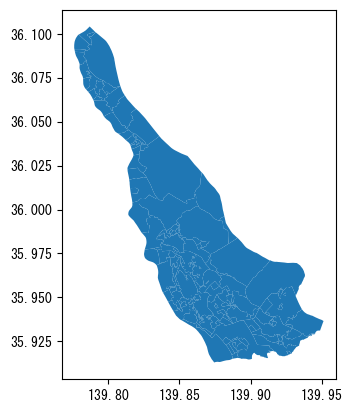

In [6]:
fig,ax = plt.subplots()
gdf.plot(ax=ax)

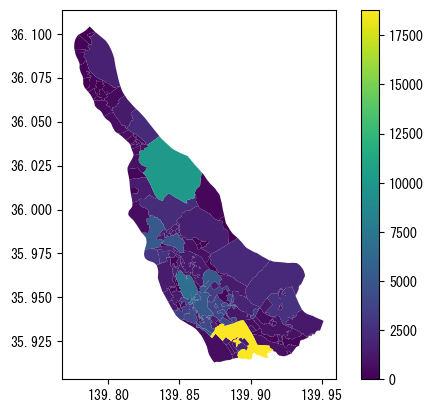

In [7]:
fig,ax = plt.subplots()
gdf.plot(ax=ax,
         column='JINKO',
         legend=True);

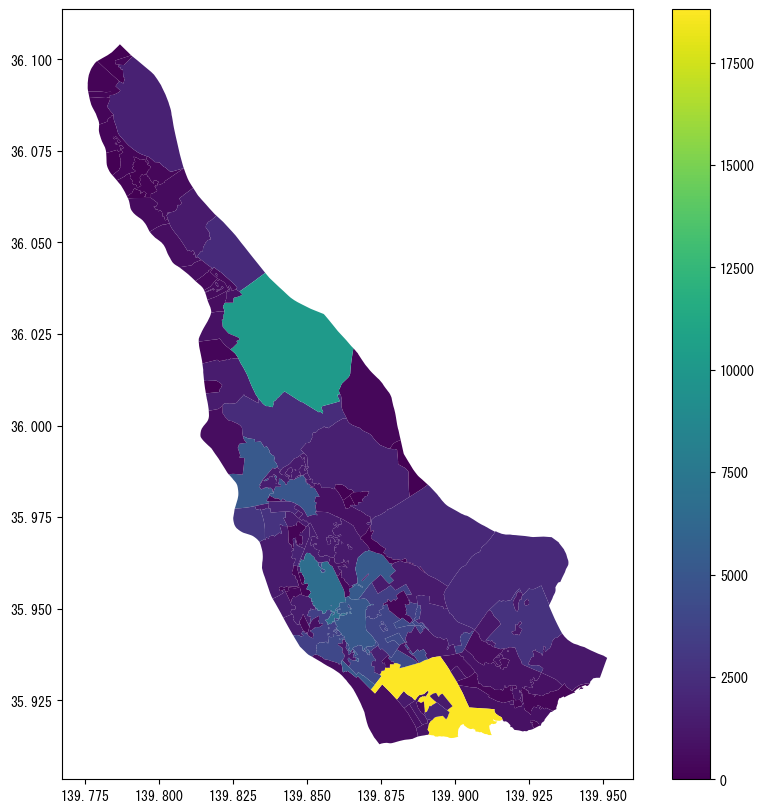

In [8]:
# population map
fig,ax = plt.subplots(figsize=(10,10))
gdf.plot(ax=ax,
         column='JINKO',
         legend=True);

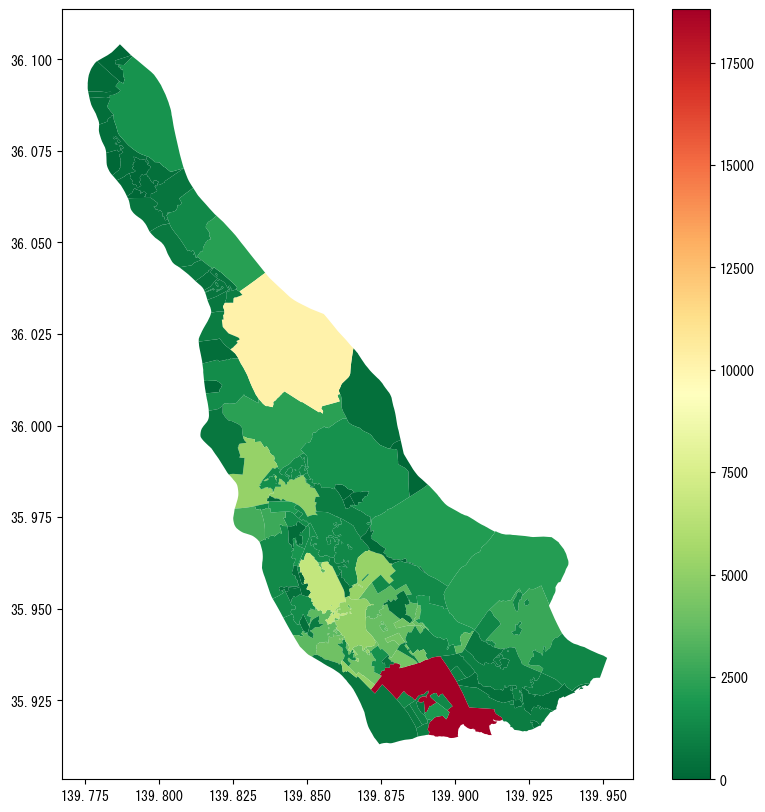

In [9]:
fig,ax = plt.subplots(figsize=(10,10))
gdf.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='RdYlGn_r');

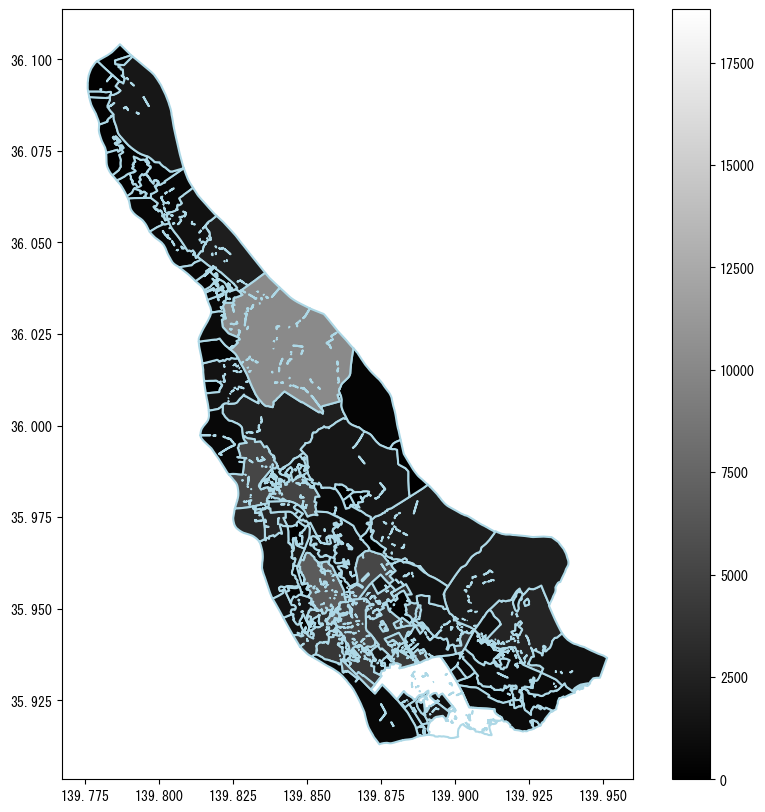

In [10]:
fig,ax = plt.subplots(figsize=(10,10))
gdf.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='gray',
         edgecolor='lightblue',
         linewidth=1.5);

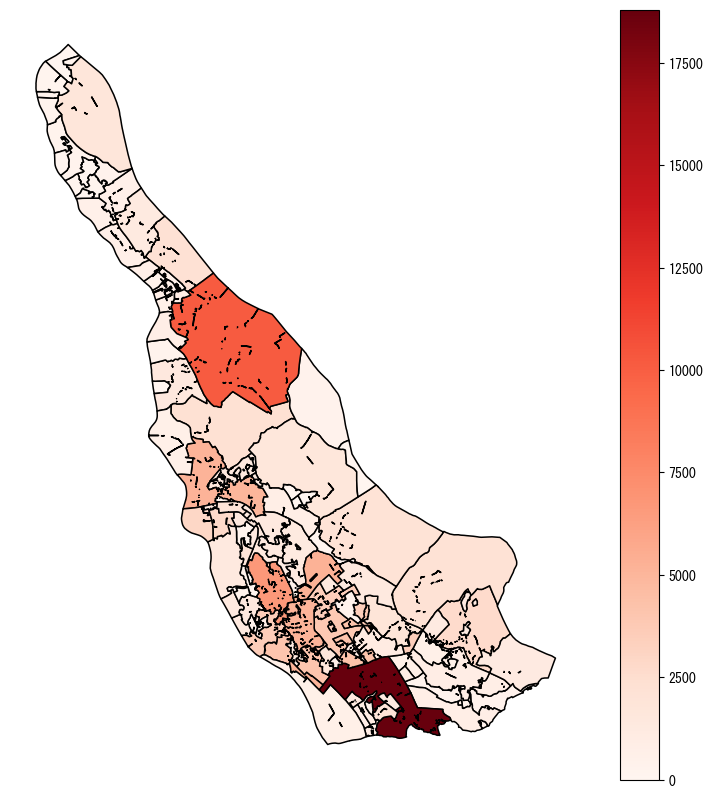

In [11]:
fig,ax = plt.subplots(figsize=(10,10))
gdf.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=1.1);


ax.axis('off');

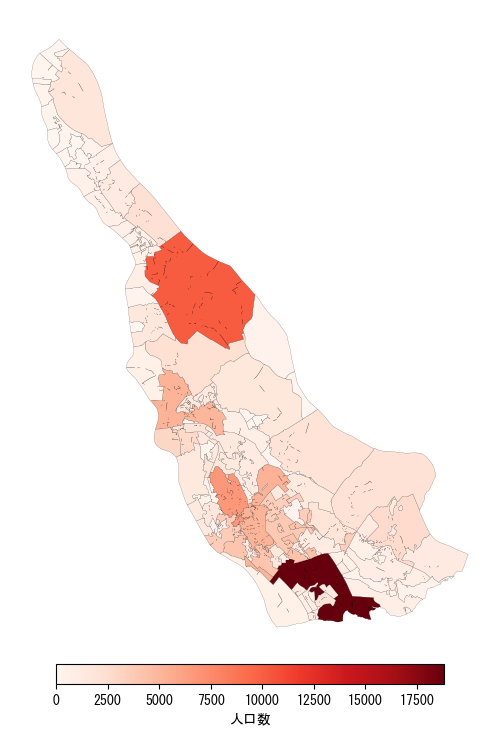

In [12]:
fig,ax = plt.subplots(figsize=(10,10))
gdf.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=0.1,
         legend_kwds={'label': "人口数",'shrink': 0.5, 'orientation': "horizontal", 'pad': 0.01}
         )

ax.axis('off');

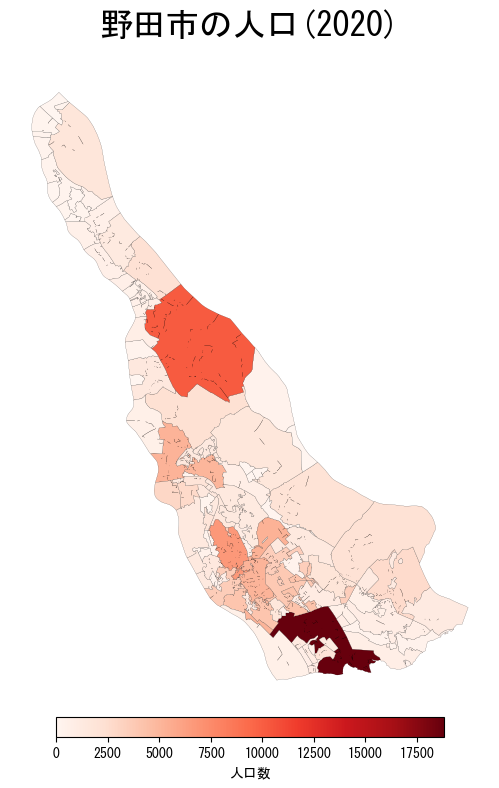

In [13]:
fig,ax = plt.subplots(figsize=(10,10))
gdf.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=0.1,
         legend_kwds={'label': "人口数",'shrink': 0.5, 'orientation': "horizontal", 'pad': 0.01}
         )

ax.axis('off')

ax.set_title('野田市の人口(2020)',fontsize=24, pad=20);

In [14]:
import contextily as cx

In [15]:
gdf=gdf.to_crs(3857)

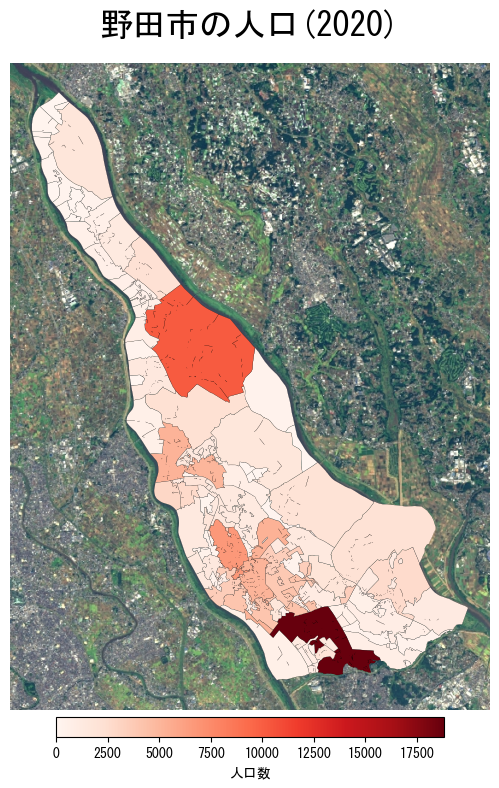

In [16]:
fig,ax = plt.subplots(figsize=(10,10))

gdf.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=0.1,
         legend_kwds={'label': "人口数",'shrink': 0.5, 'orientation': "horizontal", 'pad': 0.01}
         )

ax.axis('off')

ax.set_title('野田市の人口(2020)',fontsize=24, pad=20)

ctx.add_basemap(ax, source='https://cyberjapandata.gsi.go.jp/xyz/seamlessphoto/{z}/{x}/{y}.jpg');

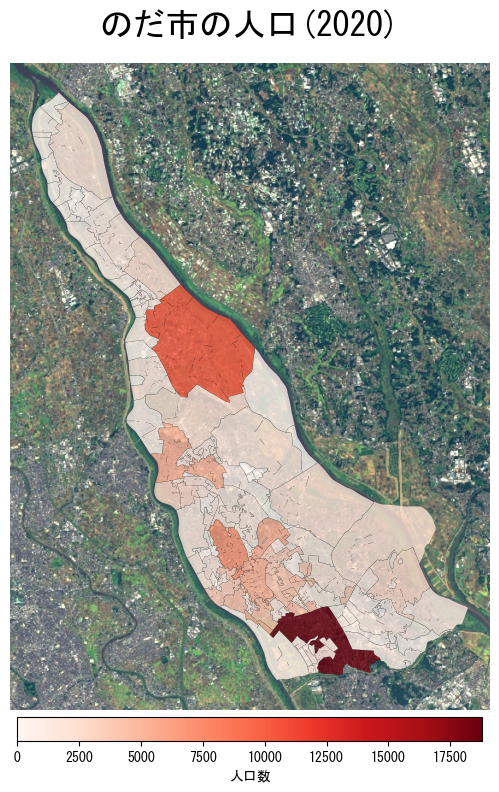

In [17]:
fig, ax = plt.subplots(figsize=(10,10))

gdf.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='Reds',
         edgecolor='black',
         linewidth=0.1,
         alpha=0.8,
         legend_kwds={'label': "人口数",'shrink': 0.6, 'orientation': "horizontal", 'pad': 0.01}
         )

ax.axis('off')

ax.set_title('のだ市の人口(2020)', fontsize=24,pad=20)

ctx.add_basemap(ax, source='https://cyberjapandata.gsi.go.jp/xyz/seamlessphoto/{z}/{x}/{y}.jpg')


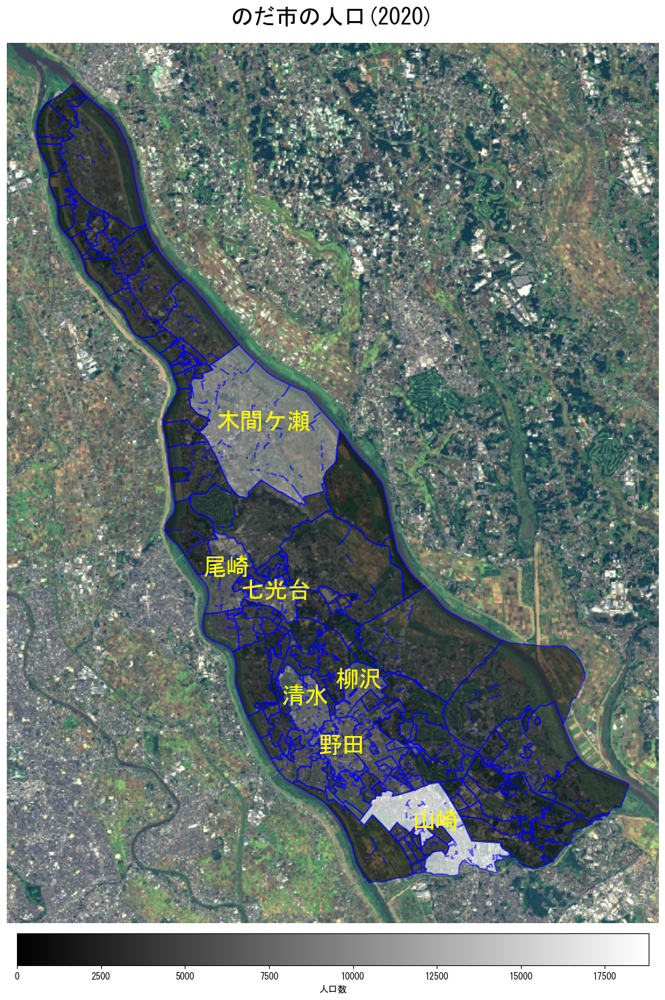

In [25]:
fig, ax = plt.subplots(figsize=(20,20))

gdf.plot(ax=ax,
         column='JINKO',
         legend=True,
         cmap='gray',
         edgecolor='blue',
         linewidth=1.5,
         alpha=0.6,
         legend_kwds={'label': "人口数",'shrink': 0.6, 'orientation': "horizontal", 'pad': 0.01}
         )

ax.axis('off')

gdf_sorted = gdf.sort_values('JINKO', ascending=False)

top_7 = gdf_sorted.head(7)

for idx, row in top_7.iterrows():
    ax.annotate(row['S_NAME'], (row.geometry.centroid.x, row.geometry.centroid.y), color='yellow', fontsize=25, ha='center')

ax.set_title('のだ市の人口(2020)', fontsize=24,pad=20)

ctx.add_basemap(ax, source='https://cyberjapandata.gsi.go.jp/xyz/seamlessphoto/{z}/{x}/{y}.jpg')


#memo
文字を大きくすると重なり合ってしまうため、少し見づらくなってしまっている。そのため、表示させる数を10から7に減らした。そして、マップの大きさ自体も変えた。
cmapの部分も変化や多い少ないが分かりにくいが、文字を見やすくするために犠牲にした。

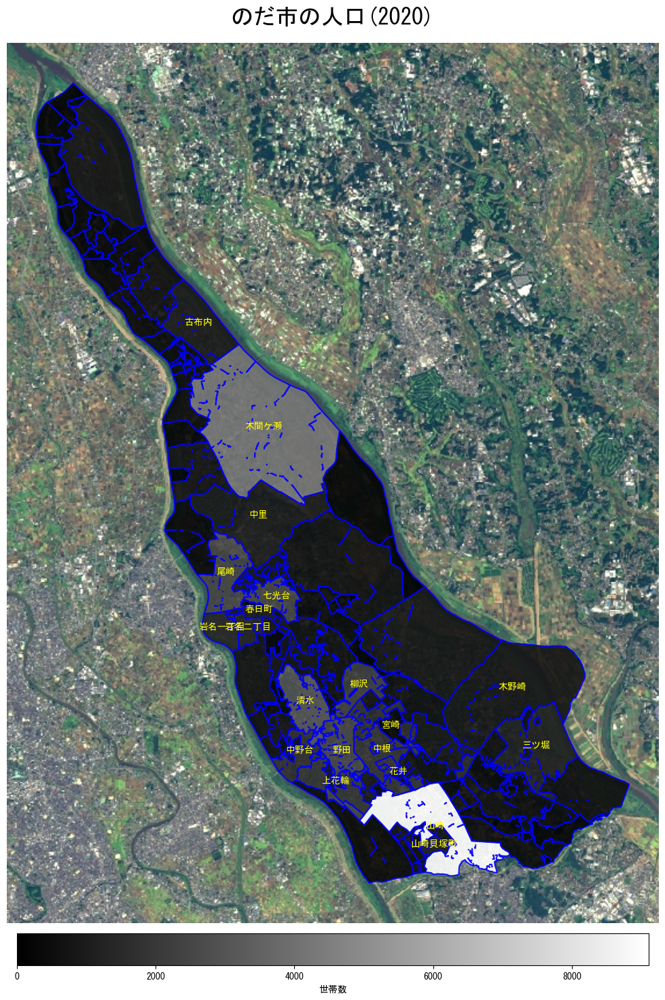

In [29]:
fig, ax = plt.subplots(figsize=(20,20))

gdf.plot(ax=ax,
         column='SETAI',
         legend=True,
         cmap='gray',
         edgecolor='blue',
         linewidth=1.5,
         alpha=0.9,
         legend_kwds={'label': "世帯数",'shrink': 0.6, 'orientation': "horizontal", 'pad': 0.01}
         )

ax.axis('off')

gdf_sorted = gdf.sort_values('SETAI', ascending=False)


top_10 = gdf_sorted.head(20)

for idx, row in top_10.iterrows():
    ax.annotate(row['S_NAME'], (row.geometry.centroid.x, row.geometry.centroid.y), color='yellow', fontsize=10, ha='center')
ax.set_title('のだ市の人口(2020)', fontsize=24,pad=20)

ctx.add_basemap(ax, source='https://cyberjapandata.gsi.go.jp/xyz/seamlessphoto/{z}/{x}/{y}.jpg')